In [117]:
import pandas as pd
import numpy as np
import pandas as pd
import os

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE

from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier
from xgboost import XGBClassifier

from sklearn import tree
import xgboost as xgb
from numpy import loadtxt
from xgboost import XGBClassifier
from xgboost import plot_tree

import gc
from tqdm import tqdm

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, recall_score

from sklearn.model_selection import cross_val_predict
from keras import models
from keras import layers
from keras import regularizers
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import load_model
from scipy import stats
import statsmodels.api as sm
from sklearn import tree
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from xgboost import XGBRFClassifier
from sklearn.metrics import roc_auc_score
from scipy import stats
from keras import optimizers
from keras.optimizers import Adam
from keras.optimizers import SGD
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [4]:
column_defs = pd.read_excel('data\LCDataDictionary.xlsx',index_col='LoanStatNew')
column_defs.columns

Index(['Description'], dtype='object')

In [5]:
def column_info(col_name):
    return column_defs.loc[col_name]['Description']

In [6]:
def reduce_mem_usage(df, int_cast=True, obj_to_category=False, subset=None):
    """
    Iterate through all the columns of a dataframe and modify the data type to reduce memory usage.
    :param df: dataframe to reduce (pd.DataFrame)
    :param int_cast: indicate if columns should be tried to be casted to int (bool)
    :param obj_to_category: convert non-datetime related objects to category dtype (bool)
    :param subset: subset of columns to analyse (list)
    :return: dataset with the column dtypes adjusted (pd.DataFrame)
    """
    start_mem = df.memory_usage().sum() / 1024 ** 2;
    gc.collect()
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))

    cols = subset if subset is not None else df.columns.tolist()

    for col in tqdm(cols):
        col_type = df[col].dtype

        if col_type != object and col_type.name != 'category' and 'datetime' not in col_type.name:
            c_min = df[col].min()
            c_max = df[col].max()

            # test if column can be converted to an integer
            treat_as_int = str(col_type)[:3] == 'int'
            if int_cast and not treat_as_int:
                treat_as_int = check_if_integer(df[col])

            if treat_as_int:
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.uint8).min and c_max < np.iinfo(np.uint8).max:
                    df[col] = df[col].astype(np.uint8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.uint16).min and c_max < np.iinfo(np.uint16).max:
                    df[col] = df[col].astype(np.uint16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.uint32).min and c_max < np.iinfo(np.uint32).max:
                    df[col] = df[col].astype(np.uint32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)
                elif c_min > np.iinfo(np.uint64).min and c_max < np.iinfo(np.uint64).max:
                    df[col] = df[col].astype(np.uint64)
            else:
                if c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        elif 'datetime' not in col_type.name and obj_to_category:
            df[col] = df[col].astype('category')
    gc.collect()
    end_mem = df.memory_usage().sum() / 1024 ** 2
    print('Memory usage after optimization is: {:.3f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))

    return df

In [7]:
def model_results(x_test,y_test,features,model):
    y_hat = model.predict(x_test[features])
    cf = confusion_matrix(y_test,y_hat)
    plot_confusion_matrix(model,x_test[features],y_test,cmap=plt.cm.Blues,
                     display_labels=["Fully Paid", "Charged Off"],
                      values_format=".5g")
    plt.title("{} Confusion Matrix".format(model))

    print(confusion_matrix(y_test, y_hat))
    print(classification_report(y_test, y_hat))

In [35]:
def model_scores(y_true,y_pred,model_name):
    results = ({'Model':model_name,
               'precision_score': precision_score(y_true,y_pred),
               'recall_score': recall_score(y_true,y_pred),
               'accuracy_score': accuracy_score(y_true,y_pred),
               'f1_score': f1_score(y_true,y_pred)})
    model_results = pd.DataFrame(data=results,index=[0])
    return model_results

In [9]:
df = pd.read_csv('data/full_clean_pre_z')
df.drop('Unnamed: 0',axis=1,inplace=True)
reduce_mem_usage(df,int_cast=False)

  0%|          | 0/50 [00:00<?, ?it/s]

Memory usage of dataframe is 662.59 MB


100%|██████████| 50/50 [00:05<00:00,  8.94it/s]


Memory usage after optimization is: 374.363 MB
Decreased by 43.5%


,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_length,home_ownership,annual_inc,verification_status,...,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,pub_rec_bankruptcies,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit,average_fico,region
0,12000.0,36,10.99,392.799988,B,B2,4,RENT,60000.0,Not Verified,...,0.0,0.0,4.0,100.000000,0.0,7137.0,18100.0,0.0,722.0,South
1,4800.0,36,10.99,157.100006,B,B2,2,MORTGAGE,39600.0,Source Verified,...,0.0,0.0,0.0,100.000000,0.0,4136.0,25700.0,0.0,757.0,South
2,27060.0,36,10.99,885.500000,B,B2,10,OWN,55000.0,Verified,...,0.0,0.0,1.0,100.000000,0.0,70186.0,35700.0,33054.0,732.0,Midwest
3,12000.0,36,7.62,374.000000,A,A3,3,MORTGAGE,96500.0,Not Verified,...,0.0,0.0,3.0,100.000000,0.0,46738.0,14800.0,53404.0,707.0,South
4,14000.0,36,12.85,470.799988,B,B4,4,RENT,88000.0,Not Verified,...,0.0,0.0,0.0,78.599998,1.0,17672.0,3900.0,27340.0,672.0,South
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1736932,24000.0,60,23.99,690.500000,E,E2,1,RENT,107000.0,Source Verified,...,0.0,1.0,2.0,87.500000,1.0,60812.0,28200.0,64422.0,672.0,West
1736933,10000.0,36,7.99,313.200012,A,A5,10,MORTGAGE,65000.0,Source Verified,...,0.0,0.0,2.0,92.599998,0.0,55863.0,34800.0,70203.0,727.0,Northeast
1736934,10050.0,36,16.99,358.200012,D,D1,8,RENT,37000.0,Not Verified,...,0.0,0.0,5.0,95.199997,0.0,14300.0,9000.0,0.0,707.0,South
1736935,6000.0,36,11.44,197.800003,B,B4,5,RENT,41000.0,Source Verified,...,0.0,0.0,1.0,94.400002,0.0,26201.0,8100.0,34076.0,672.0,Northeast


In [10]:
#list of categorical variables to get ohe
categorical = ['sub_grade',
 'grade',
 'home_ownership',
 'verification_status',
 'purpose',
 'application_type',
 'region']


cat_drop = ['sub_grade',
 'grade',
 'home_ownership',
 'verification_status',
 'purpose',
 'application_type',
 'region','loan_status']

In [11]:
cont_columns = df.drop(columns=cat_drop).columns

In [12]:
# removing outliers greater than 4 std deviations to standardize
df_cont_z = df[(np.abs(stats.zscore(df[cont_columns]))<4).all(axis=1)]
z_score_df = df.loc[df_cont_z.index]

In [13]:
onehot = pd.get_dummies(z_score_df[categorical],drop_first=True)

In [14]:
cont = z_score_df.drop(columns=cat_drop)


In [15]:
x= pd.concat([cont,onehot],axis=1)
y= z_score_df['loan_status'].map(lambda x: 1 if x== "Charged Off" else 0)

In [16]:
#splitting our x and y into training and testing samples
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3,random_state=42)

In [17]:
#importing our priorly smoted x train and y train samples
x_smote = pd.read_csv('data/x_smote_z')
y_smote = pd.read_csv('data/y_smote_z')

In [18]:
# as we dropped columns after testing to our original df need to drop from smote so they aren't included in smote modeling
# at end will need to re run smote 
x_smote.drop(columns=['Unnamed: 0','total_rec_int','total_rec_prncp','total_pymnt',
                 'tot_coll_amt','num_il_tl','delinq_amnt','tax_liens','last_pymnt_amnt'],axis=1,inplace=True)

In [19]:
reduce_mem_usage(x_smote,int_cast=False)

  0%|          | 0/106 [00:00<?, ?it/s]

Memory usage of dataframe is 1314.89 MB


100%|██████████| 106/106 [00:14<00:00,  7.07it/s]


Memory usage after optimization is: 350.430 MB
Decreased by 73.3%


,loan_amnt,term,int_rate,installment,emp_length,annual_inc,dti,delinq_2yrs,inq_last_6mths,pub_rec,...,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,application_type_Joint App,region_Northeast,region_South,region_West
0,7750.000000,36,10.990000,253.800003,3,29000.000000,25.200001,0.000000,0.000000,1.000000,...,0,0,0,0,0,0,0,0,0,0
1,10000.000000,36,22.910000,386.799988,1,72000.000000,8.200000,1.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,1,0
2,10000.000000,36,12.990000,337.000000,6,40000.000000,22.500000,0.000000,2.000000,0.000000,...,0,1,0,0,0,0,0,0,0,0
3,5500.000000,36,16.549999,194.899994,4,54224.000000,20.440001,0.000000,2.000000,0.000000,...,0,0,0,0,0,0,0,0,1,0
4,25000.000000,36,14.520000,861.000000,5,75000.000000,24.980000,0.000000,2.000000,1.000000,...,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1625891,24366.757812,51,17.206345,707.872986,4,117479.695312,21.083889,0.633242,1.100275,0.000000,...,0,0,0,0,0,0,0,0,1,0
1625892,19482.703125,50,15.419235,542.377869,5,51204.097656,22.845705,0.000000,0.602049,0.602049,...,0,0,0,0,0,0,0,0,0,0
1625893,13179.145508,36,14.562667,461.734833,6,55000.000000,18.415403,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0
1625894,17840.857422,45,21.473141,597.083801,8,54589.417969,23.626722,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0


In [20]:
y_smote.drop('Unnamed: 0',axis=1,inplace=True)
reduce_mem_usage(y_smote,int_cast=False)

100%|██████████| 1/1 [00:00<00:00, 142.86it/s]

Memory usage of dataframe is 12.40 MB
Memory usage after optimization is: 1.551 MB
Decreased by 87.5%


,loan_status
0,0
1,1
2,0
3,1
4,1
...,...
1625891,1
1625892,1
1625893,1
1625894,1


In [21]:
scaler = MinMaxScaler()

In [22]:
#scaling our smote training samples
x_smote_cont =  pd.DataFrame(scaler.fit_transform(x_smote[cont_columns]),columns=cont_columns)
x_smote_scaled = pd.concat([x_smote_cont,x_smote[onehot.columns]],axis=1)

#scaling for our x test sample
x_test= x_test.reset_index().drop('index',axis=1)
x_test_cont_scaled = pd.DataFrame(scaler.transform(x_test[cont_columns]),columns=cont_columns)
x_test_scaled = pd.concat([x_test_cont_scaled,x_test[onehot.columns]],axis=1)

In [23]:
#further splitting our training into validation sets we will use in crossvalidation
x_train_final, x_val, y_train_final, y_val = train_test_split(x_smote_scaled, y_smote, test_size=.3,random_state=42)

In [24]:
x_train = x_train.reset_index().drop('index',axis=1)
x_cont =  pd.DataFrame(scaler.fit_transform(x_train[cont_columns]),columns=cont_columns)
x_train_scaled = pd.concat([x_cont,x_train[onehot.columns]],axis=1)


In [25]:
y_train = y_train.reset_index().drop('index',axis=1)

In [26]:
## Relevant feature groups
#for testing unsmoted without recoveries
og_no =['loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs','inq_last_6mths',
 'revol_bal','average_fico','total_acc','total_rec_late_fee','tot_cur_bal','bc_util','mo_sin_rcnt_tl',
 'mort_acc','mths_since_recent_bc','mths_since_recent_inq',
 'num_accts_ever_120_pd','num_bc_sats','num_bc_tl','num_op_rev_tl','num_tl_90g_dpd_24m',
'num_tl_op_past_12m','pct_tl_nvr_dlq','pub_rec_bankruptcies','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit',
'grade_B','grade_C','grade_D','grade_E','grade_F','grade_G','home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified','purpose_credit_card','purpose_debt_consolidation',
'purpose_home_improvement','purpose_house','purpose_major_purchase','purpose_other','purpose_renewable_energy',
'purpose_small_business','purpose_vacation','purpose_wedding','application_type_Joint App', 'region_South','region_West']

#for testing unsmoted with recoveries
og_yes = ['recoveries',
'loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs',
 'revol_bal','average_fico','total_acc','total_rec_late_fee','tot_cur_bal','bc_util',
 'mort_acc','mths_since_recent_bc','mths_since_recent_inq',
'num_bc_sats','num_bc_tl','num_op_rev_tl','num_tl_90g_dpd_24m',
'num_tl_op_past_12m','pct_tl_nvr_dlq','pub_rec_bankruptcies','total_bal_ex_mort','total_bc_limit','total_il_high_credit_limit',
'grade_B','grade_C','grade_D','grade_E','grade_F','grade_G','home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified','purpose_credit_card','purpose_debt_consolidation',
'purpose_home_improvement','purpose_house','purpose_major_purchase','purpose_other',
'purpose_vacation','purpose_wedding','application_type_Joint App', 'region_South','region_West']

#for testing smoted samples with recoveries
recover = ['recoveries',
'loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs','inq_last_6mths',
'pub_rec', 'revol_bal','total_acc','total_rec_late_fee','tot_cur_bal','bc_util','mo_sin_rcnt_tl',
 'mths_since_recent_bc', 'num_accts_ever_120_pd',
 'num_bc_sats', 'num_bc_tl',
 'num_op_rev_tl', 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
 'total_bal_ex_mort', 'total_bc_limit',
 'total_il_high_credit_limit','average_fico',
 'sub_grade_A2',
 'sub_grade_A3','sub_grade_A4','sub_grade_A5','sub_grade_B1','sub_grade_B2','sub_grade_B3','sub_grade_B4','sub_grade_B5',
 'sub_grade_C1','sub_grade_C2','sub_grade_C3','sub_grade_C4','sub_grade_C5','sub_grade_D1','sub_grade_D2',
 'sub_grade_D3','sub_grade_D4','sub_grade_D5','sub_grade_E1'
,'sub_grade_E2','sub_grade_E3','sub_grade_E4','sub_grade_E5','sub_grade_F1','sub_grade_F2','sub_grade_F3','sub_grade_F4',
 'sub_grade_F5','sub_grade_G1','sub_grade_G2','sub_grade_G3','sub_grade_G4','sub_grade_G5',
 'home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified',
 'purpose_credit_card','purpose_debt_consolidation','purpose_home_improvement','purpose_house','purpose_major_purchase',
'purpose_other','purpose_renewable_energy','purpose_small_business','purpose_vacation', 'purpose_wedding','purpose_medical',
'purpose_moving',
'application_type_Joint App',
 'region_South','region_West','region_Northeast']

no_recover = ['loan_amnt','term','int_rate','installment','emp_length','annual_inc','dti','delinq_2yrs','inq_last_6mths',
'pub_rec', 'revol_bal','total_acc','total_rec_late_fee','tot_cur_bal','bc_util','mo_sin_rcnt_tl',
 'mths_since_recent_bc', 'num_accts_ever_120_pd',
 'num_bc_sats', 'num_bc_tl',
 'num_op_rev_tl', 'num_tl_90g_dpd_24m',
 'num_tl_op_past_12m', 'pct_tl_nvr_dlq',
 'total_bal_ex_mort', 'total_bc_limit',
 'total_il_high_credit_limit','average_fico',
 'sub_grade_A2',
 'sub_grade_A3','sub_grade_A4','sub_grade_A5','sub_grade_B1','sub_grade_B2','sub_grade_B3','sub_grade_B4','sub_grade_B5',
 'sub_grade_C1','sub_grade_C2','sub_grade_C3','sub_grade_C4','sub_grade_C5','sub_grade_D1','sub_grade_D2',
 'sub_grade_D3','sub_grade_D4','sub_grade_D5','sub_grade_E1'
,'sub_grade_E2','sub_grade_E3','sub_grade_E4','sub_grade_E5','sub_grade_F1','sub_grade_F2','sub_grade_F3','sub_grade_F4',
 'sub_grade_F5','sub_grade_G1','sub_grade_G2','sub_grade_G3','sub_grade_G4','sub_grade_G5',
 'home_ownership_MORTGAGE','home_ownership_OWN','home_ownership_RENT',
'verification_status_Source Verified','verification_status_Verified',
 'purpose_credit_card','purpose_debt_consolidation','purpose_home_improvement','purpose_house','purpose_major_purchase',
'purpose_other','purpose_renewable_energy','purpose_small_business','purpose_vacation', 'purpose_wedding','purpose_medical',
'purpose_moving',
'application_type_Joint App',
 'region_South','region_West','region_Northeast']

## Best Random Forest

In [28]:
rf = RandomForestClassifier(n_estimators=25,criterion='entropy',min_samples_leaf=1,min_samples_split=2,n_jobs=4)

In [29]:
rf.fit(x_train_final[no_recover],y_train_final)

<ipython-input-29-b056f4ba5af9>:1: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rf.fit(x_train_final[no_recover],y_train_final)


RandomForestClassifier(criterion='entropy', n_estimators=25, n_jobs=4)

[[347806   8740]
 [ 33449  46568]]
              precision    recall  f1-score   support

           0       0.91      0.98      0.94    356546
           1       0.84      0.58      0.69     80017

    accuracy                           0.90    436563
   macro avg       0.88      0.78      0.82    436563
weighted avg       0.90      0.90      0.90    436563



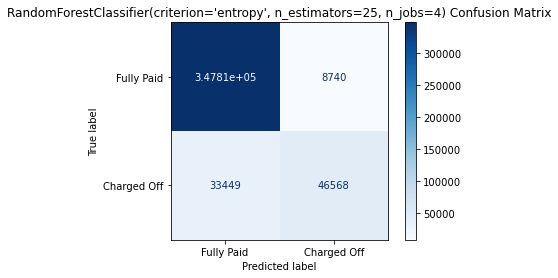

In [31]:
model_results(x_test_scaled,y_test,no_recover,rf)

In [32]:
y_hat_rf = rf.predict(x_test_scaled[no_recover])

In [37]:
rf_scores = model_scores(y_test,y_hat_rf,"Random Forest")

In [46]:
rf_featured_df = pd.concat([pd.DataFrame(x_train_final[no_recover].columns,columns=['Features']),
                            pd.DataFrame(rf.feature_importances_,columns=['Feature_Importance'])],axis=1,)
rf_featured_df = rf_featured_df.sort_values(by="Feature_Importance",ascending=False)

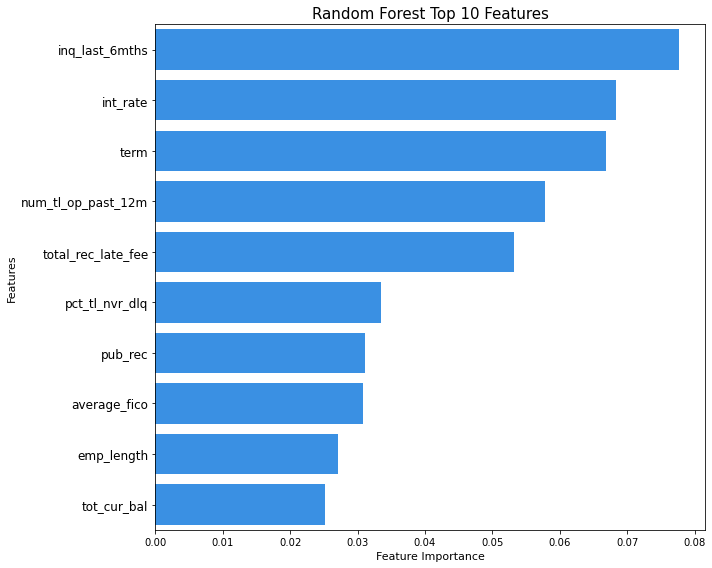

In [68]:
plt.figure(figsize=(10,8))
sns.barplot(data=rf_featured_df.head(10),y='Features',x='Feature_Importance',color='dodgerblue')
plt.xlabel('Feature Importance',fontsize=11)
plt.xticks(fontsize=10)
plt.yticks(fontsize=12)
plt.ylabel('Features',fontsize=11)
plt.title('Random Forest Top 10 Features',fontsize=15)
plt.tight_layout()
plt.savefig('rf_features.png')

In [70]:
from sklearn import tree as tr

In [81]:
fn = np.array(x_train_final[no_recover].columns)
cn =  np.array(['Fully Paid', 'Charged Off'])
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (25,18), dpi=800)
tr.plot_tree(rf.estimators_[0],
               feature_names = fn,
               class_names=cn,
               filled = True,max_depth=3,rounded=True,fontsize=13)

plt.savefig('rf_tree.png')

## Best Decision Tree

In [82]:
# smote resampled
tree = DecisionTreeClassifier()

In [83]:
tree.fit(x_train_final[no_recover],y_train_final)

DecisionTreeClassifier()

[[320689  35857]
 [ 27862  52155]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91    356546
           1       0.59      0.65      0.62     80017

    accuracy                           0.85    436563
   macro avg       0.76      0.78      0.77    436563
weighted avg       0.86      0.85      0.86    436563



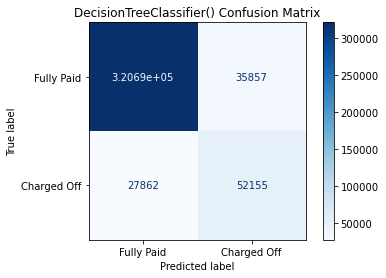

In [84]:
model_results(x_test_scaled,y_test,no_recover,tree)

In [85]:
y_hat_tree = tree.predict(x_test_scaled[no_recover])

In [86]:
tree_scores = model_scores(y_test,y_hat_tree,"Decision Tree")
tree_scores

,Model,precision_score,recall_score,accuracy_score,f1_score
0,Decision Tree,0.59259,0.651799,0.854044,0.620786


In [88]:
fn = np.array(x_train_final[no_recover].columns)
cn =  np.array(['Fully Paid', 'Charged Off'])
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (25,18), dpi=800)
tr.plot_tree(tree,
               feature_names = fn,
               class_names=cn,
               filled = True,max_depth=3,rounded=True,fontsize=13)
plt.savefig("decision_tree_tree.png")

In [ ]:
fn = np.array(x_train_final[no_recover].columns)
cn =  np.array(['Fully Paid', 'Charged Off'])
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (25,18), dpi=800)
tr.plot_tree(rf.estimators_[0],
               feature_names = fn,
               class_names=cn,
               filled = True,max_depth=3,rounded=True,fontsize=13)

In [90]:
tree_featured_df = pd.concat([pd.DataFrame(x_train_final[no_recover].columns,columns=['Features']),
                            pd.DataFrame(tree.feature_importances_,columns=['Feature_Importance'])],axis=1,)
tree_featured_df = tree_featured_df.sort_values(by="Feature_Importance",ascending=False)

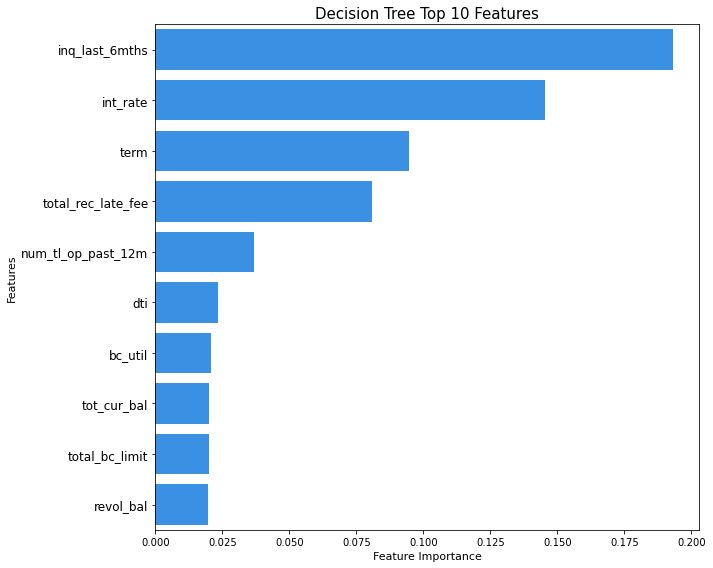

In [92]:
plt.figure(figsize=(10,8))
sns.barplot(data=tree_featured_df.head(10),y='Features',x='Feature_Importance',color='dodgerblue')
plt.xlabel('Feature Importance',fontsize=11)
plt.xticks(fontsize=10)
plt.yticks(fontsize=12)
plt.ylabel('Features',fontsize=11)
plt.title('Decision Tree Top 10 Features',fontsize=15)
plt.tight_layout()
plt.savefig('tree_features.png')

## Best XGBoosted Decision Tree

In [93]:
def modelfit2(model, x, y, features, xval, yval, useTrainCV=True, cv_folds=3, early_stopping_rounds=5):
    
    if useTrainCV:
        xgb_param = model.get_xgb_params()
        xgtrain = xgb.DMatrix(x[features], label=y.loan_status.values)
        cvresult = xgb.cv(xgb_param, xgtrain, num_boost_round=model.get_params()['n_estimators'], nfold=cv_folds,
            metrics='auc', early_stopping_rounds=early_stopping_rounds,verbose_eval=True)
        model.set_params(n_estimators=cvresult.shape[0])
    
    #Fit the algorithm on the data
    model.fit(x[features], y.loan_status,eval_metric='auc')
        
    #Predict training set:
    dtrain_predictions = model.predict(x[features])
    dtrain_predprob = model.predict_proba(x[features])[:,1]
    
     #Predict training set:
    dval_predictions = model.predict(xval[features])
    dval_predprob = model.predict_proba(xval[features])[:,1]
    
    #Print model report:
    print ("\nModel Report")
    print ("Accuracy : %.4g" % accuracy_score(y['loan_status'].values, dtrain_predictions))
    print ("AUC Score (Train): %f" % roc_auc_score(y['loan_status'], dtrain_predprob))
    print ("Recall Score (Train): %f" % recall_score(y['loan_status'], dtrain_predictions))
    
    print ("Accuracy : %.4g" % accuracy_score(yval['loan_status'].values, dval_predictions))
    print ("AUC Score (Val): %f" % roc_auc_score(yval['loan_status'], dval_predprob))
    print ("Recall Score (Val): %f" % recall_score(yval['loan_status'], dval_predictions))
                    
    feat_imp = pd.Series(model.get_booster().get_fscore()).sort_values(ascending=False).head(15)
    feat_imp.plot(kind='bar', title='Feature Importances')
    plt.ylabel('Feature Importance Score')

In [100]:
XG = XGBClassifier( learning_rate =0.3, n_estimators=21, max_depth=13,
 min_child_weight=2, gamma=0.4, subsample=0.8, colsample_bytree=0.8,
 objective= 'binary:logistic', nthread=4)

In [101]:
XG.fit(x_train_final[no_recover],y_train_final)

C:\Users\sergi\anaconda3\envs\learn-env\lib\site-packages\sklearn\utils\validation.py:72: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(**kwargs)


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, gamma=0.4, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.3, max_delta_step=0, max_depth=13,
              min_child_weight=2, missing=nan, monotone_constraints='()',
              n_estimators=21, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=0.8, tree_method='exact', validate_parameters=1,
              verbosity=None)

[[347928   8618]
 [ 64495  15522]]
              precision    recall  f1-score   support

           0       0.84      0.98      0.90    356546
           1       0.64      0.19      0.30     80017

    accuracy                           0.83    436563
   macro avg       0.74      0.58      0.60    436563
weighted avg       0.81      0.83      0.79    436563



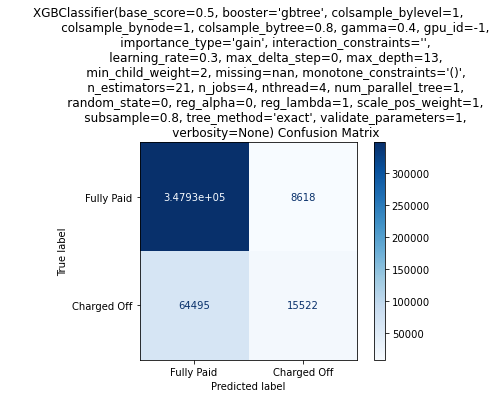

In [102]:
model_results(x_test_scaled,y_test,no_recover,XG)

In [104]:
y_hat_xg = XG.predict(x_test_scaled[no_recover])
XG_scores = model_scores(y_test,y_hat_xg,"XGBoosted Decision Tree")
XG_scores

,Model,precision_score,recall_score,accuracy_score,f1_score
0,XGBoosted Decision Tree,0.642999,0.193984,0.832526,0.29805


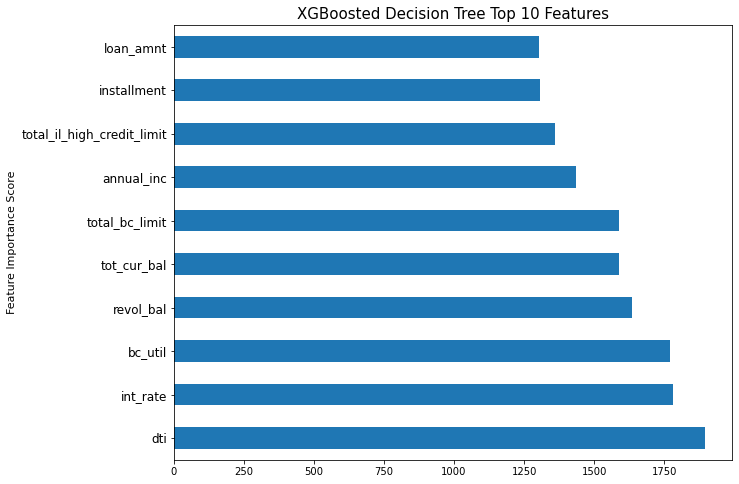

In [110]:
plt.figure(figsize=(10,8))
feat_imp = pd.Series(XG.get_booster().get_fscore()).sort_values(ascending=False).head(10)
feat_imp.plot(kind='barh', title='Feature Importances')
plt.ylabel('Feature Importance Score',fontsize=11)
plt.xticks(fontsize=10)
plt.yticks(fontsize=12)
plt.title('XGBoosted Decision Tree Top 10 Features',fontsize=15)
plt.savefig('xg_features.png')

In [113]:
xgb.to_graphviz(XG,rankdir='UT')

In [115]:
all_scores = pd.DataFrame(data=None,index=[0])
all_scores = pd.concat([tree_scores,rf_scores,XG_scores],axis=0)
all_scores

,Model,precision_score,recall_score,accuracy_score,f1_score
0,Decision Tree,0.592590,0.651799,0.854044,0.620786
0,Random Forest,0.841976,0.581976,0.903361,0.688239
0,XGBoosted Decision Tree,0.642999,0.193984,0.832526,0.298050


In [116]:
all_scores.to_csv('data/tree_scores')

## Best Neural Network

In [118]:
def visualize_training_results_accur(results):
    history = results.history
    plt.figure()
    plt.plot(history['val_loss'])
    plt.plot(history['loss'])
    plt.legend(['val_loss', 'loss'])
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()
    
    plt.figure()
    plt.plot(history['val_accuracy'])
    plt.plot(history['accuracy'])
    plt.legend(['val_acc', 'acc'])
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.show()

In [119]:
def visualize_training_results_acc(results):
    history = results.history
    plt.figure()
    plt.plot(history['val_loss'])
    plt.plot(history['loss'])
    plt.legend(['val_loss', 'loss'])
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()
    
    plt.figure()
    plt.plot(history['val_acc'])
    plt.plot(history['acc'])
    plt.legend(['val_acc', 'acc'])
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.show()

In [130]:
def test_class_report(saved_model_name,x_test,y_test,x_train,y_train):
    model = load_model(saved_model_name)
    train = model.evaluate(x_train,y_train)
    print(f'Training Loss: {train[0]:.3} \nTraining Accuracy: {train[1]:.3}')
    print('----------')
    test = model.evaluate(x_test,y_test)
    print(f'Test Loss: {test[0]:.3} \nTest Accuracy: {test[1]:.3}')
    preds = model.predict_classes(x_test)
    print(confusion_matrix(y_test, preds))
    print(classification_report(y_test, preds))

In [145]:
#reducing regularization to .0001
l2kr = regularizers.l2(.00005)
L2_drop = models.Sequential()
L2_drop.add(layers.Dense(300, activation='relu',kernel_regularizer=l2kr))
L2_drop.add(layers.Dropout(.2))
L2_drop.add(layers.Dense(150, activation='relu',kernel_regularizer=l2kr))
L2_drop.add(layers.Dropout(.2))
L2_drop.add(layers.Dense(75, activation='relu',kernel_regularizer=l2kr))
L2_drop.add(layers.Dropout(.15))
L2_drop.add(layers.Dense(15, activation='relu',kernel_regularizer=l2kr))
L2_drop.add(layers.Dropout(.15))
L2_drop.add(layers.Dense(8, activation='relu',kernel_regularizer=l2kr))
L2_drop.add(layers.Dropout(.15))
L2_drop.add(layers.Dense(3, activation='relu',kernel_regularizer=l2kr))
L2_drop.add(layers.Dropout(.15))
L2_drop.add(layers.Dense(1, activation='sigmoid'))


In [146]:
L2_drop.compile(optimizer=optimizers.Adam(learning_rate=.0001), 
                 loss='binary_crossentropy', 
                 metrics=['acc'])
early_stopping = [EarlyStopping(monitor='val_loss', patience=75), 
                  ModelCheckpoint(filepath='best_l2_drop_model.h5', monitor='val_loss', save_best_only=True)]

In [147]:
L2_drop_results = L2_drop.fit(x_train_final[no_recover], 
                            y_train_final, 
                            epochs=350, 
                            batch_size=75, 
                            validation_data=(x_val[no_recover], y_val),callbacks=early_stopping)

Epoch 1/350
15176/15176 [==============================] - 43s 3ms/step - loss: 0.4443 - acc: 0.8111 - val_loss: 0.3549 - val_acc: 0.8525
Epoch 2/350
15176/15176 [==============================] - 42s 3ms/step - loss: 0.3507 - acc: 0.8509 - val_loss: 0.3239 - val_acc: 0.8632
Epoch 3/350
15176/15176 [==============================] - 42s 3ms/step - loss: 0.3296 - acc: 0.8608 - val_loss: 0.3102 - val_acc: 0.8708
Epoch 4/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.3195 - acc: 0.8664 - val_loss: 0.3056 - val_acc: 0.8719
Epoch 5/350
15176/15176 [==============================] - 42s 3ms/step - loss: 0.3143 - acc: 0.8690 - val_loss: 0.2990 - val_acc: 0.8754
Epoch 6/350
15176/15176 [==============================] - 44s 3ms/step - loss: 0.3111 - acc: 0.8704 - val_loss: 0.2953 - val_acc: 0.8778
Epoch 7/350
15176/15176 [==============================] - 46s 3ms/step - loss: 0.3087 - acc: 0.8713 - val_loss: 0.2948 - val_acc: 0.8775
Epoch 8/350
15176/15176 [=========

15176/15176 [==============================] - 43s 3ms/step - loss: 0.2969 - acc: 0.8774 - val_loss: 0.2870 - val_acc: 0.8809
Epoch 61/350
15176/15176 [==============================] - 42s 3ms/step - loss: 0.2968 - acc: 0.8775 - val_loss: 0.2851 - val_acc: 0.8827
Epoch 62/350
15176/15176 [==============================] - 44s 3ms/step - loss: 0.2968 - acc: 0.8775 - val_loss: 0.2852 - val_acc: 0.8821
Epoch 63/350
15176/15176 [==============================] - 42s 3ms/step - loss: 0.2970 - acc: 0.8774 - val_loss: 0.2846 - val_acc: 0.8829
Epoch 64/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2970 - acc: 0.8773 - val_loss: 0.2864 - val_acc: 0.8821
Epoch 65/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2970 - acc: 0.8774 - val_loss: 0.2853 - val_acc: 0.8825
Epoch 66/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2970 - acc: 0.8775 - val_loss: 0.2850 - val_acc: 0.8824
Epoch 67/350
15176/15176 [==============

Epoch 119/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2979 - acc: 0.8776 - val_loss: 0.2856 - val_acc: 0.8833
Epoch 120/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2979 - acc: 0.8777 - val_loss: 0.2851 - val_acc: 0.8833
Epoch 121/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2976 - acc: 0.8779 - val_loss: 0.2863 - val_acc: 0.8826
Epoch 122/350
15176/15176 [==============================] - 41s 3ms/step - loss: 0.2979 - acc: 0.8777 - val_loss: 0.2857 - val_acc: 0.8829


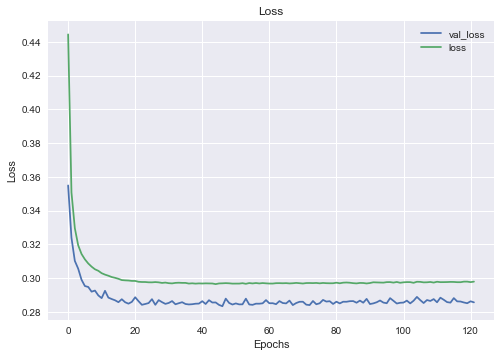

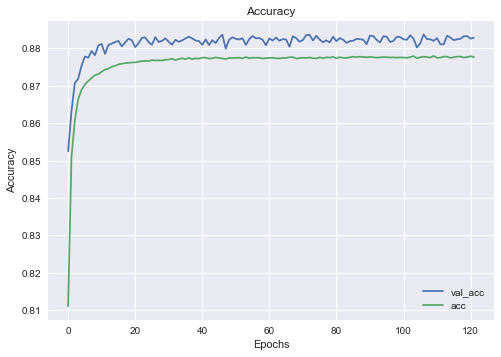

<Figure size 576x396 with 0 Axes>

In [171]:
visualize_training_results_acc(L2_drop_results)
plt.savefig('nn_results.png')

In [149]:
test_class_report('best_l2_drop_model.h5',x_test_scaled[no_recover],y_test,x_train_final[no_recover],y_train_final)

35567/35567 [==============================] - 26s 723us/step - loss: 0.2819 - acc: 0.8842
Training Loss: 0.282 
Training Accuracy: 0.884
----------
13643/13643 [==============================] - 13s 985us/step - loss: 0.4351 - acc: 0.8242
Test Loss: 0.435 
Test Accuracy: 0.824
[[349165   7381]
 [ 69382  10635]]
              precision    recall  f1-score   support

           0       0.83      0.98      0.90    356546
           1       0.59      0.13      0.22     80017

    accuracy                           0.82    436563
   macro avg       0.71      0.56      0.56    436563
weighted avg       0.79      0.82      0.78    436563



In [151]:
best_NN = load_model('best_l2_drop_model.h5')

In [152]:
y_pred_nn = best_NN.predict_classes(x_test_scaled[no_recover])

In [155]:
NN_score = model_scores(y_test,y_pred_nn,"Neural Network")

In [157]:
log_scores = pd.read_csv('data/log_scores')

In [159]:
log_scores.drop('Unnamed: 0',axis=1,inplace=True)

In [160]:
log_scores

,Model,precision_score,recall_score,accuracy_score,f1_score
0,Logistic Regression,0.408908,0.236125,0.797429,0.299375


In [166]:
final_results = pd.concat([log_scores,all_scores,NN_score])

In [167]:
final_results= final_results.set_index('Model')

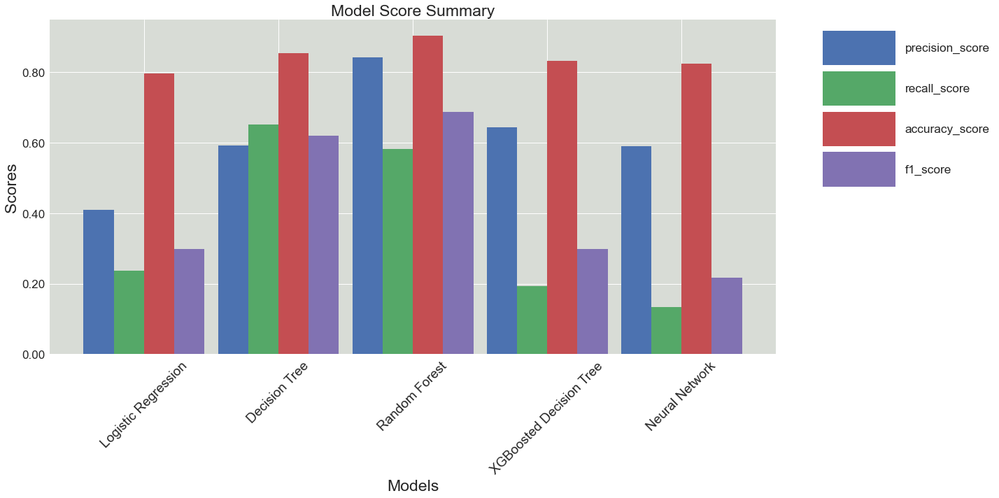

In [169]:
from matplotlib.ticker import FormatStrFormatter

fig,ax = plt.subplots()
plt.style.use('seaborn')
ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
ax.set_facecolor('#d8dcd6')
final_results.plot(kind='bar',figsize=(20,10), ax=ax,width=.9)
plt.xticks(rotation=45)
plt.legend(loc='upper left', bbox_to_anchor=(1.05,1),ncol=1,fancybox=True,shadow=True,
           handlelength=6, handleheight=4,fontsize='xx-large' )
plt.title('Model Score Summary',size=23)
plt.ylabel('Scores',size=23)
plt.xlabel('Models',size=23)
plt.xticks(size=19)
plt.yticks(size=17)
plt.tight_layout()
plt.savefig('result_table.png')